In [1]:
import os
import anndata as ad
import numpy as np
import scanpy as sc
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import omicverse as ov
import scvi
from scvi.model.utils import mde

import warnings
warnings.filterwarnings('ignore')
%load_ext autoreload
%autoreload 2


   ____            _     _    __                  
  / __ \____ ___  (_)___| |  / /__  _____________ 
 / / / / __ `__ \/ / ___/ | / / _ \/ ___/ ___/ _ \ 
/ /_/ / / / / / / / /__ | |/ /  __/ /  (__  )  __/ 
\____/_/ /_/ /_/_/\___/ |___/\___/_/  /____/\___/                                              

Version: 1.5.3, Tutorials: https://omicverse.readthedocs.io/


[rank: 0] Global seed set to 0


In [2]:
sc.settings.set_figure_params(dpi=100, frameon=False)
sc.set_figure_params(dpi=100)
sc.set_figure_params(figsize=(3, 3))
plt.rcParams['figure.dpi'] = 100
plt.rcParams['figure.figsize'] = (3, 3)

In [3]:
# Load dataset
os.chdir("/storage2/liuxiaodongLab/fanxueying/liu-lab_projects/XueyingFan/Hypoblast/code/20260210_hypo_final_99")
adata = sc.read('/storage2/liuxiaodongLab/jiangjing/Projects/XueyingFan/PD_XueyingFan/20260209_hypoblast_99sample_anno/output/adata_qc_with_groups_label_hvg.h5ad')
adata

AnnData object with n_obs × n_vars = 1170931 × 2000
    obs: 'condition', 'cell_name_in_hg38_mm10', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'n_genes', 'leiden', 'group', 'day', 'group_day', 'orig.ident', 'is_original_query', 'original_query_id', 'lineage_pred', 'lineage_uncert'
    var: 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: 'hvg', 'leiden', 'log1p', 'neighbors', 'pca', 'umap'
    obsm: 'X_pca', 'X_umap', 'X_umap_scpoli_lineage'
    varm: 'PCs'
    layers: 'counts', 'logcounts'
    obsp: 'connectivities', 'distances'

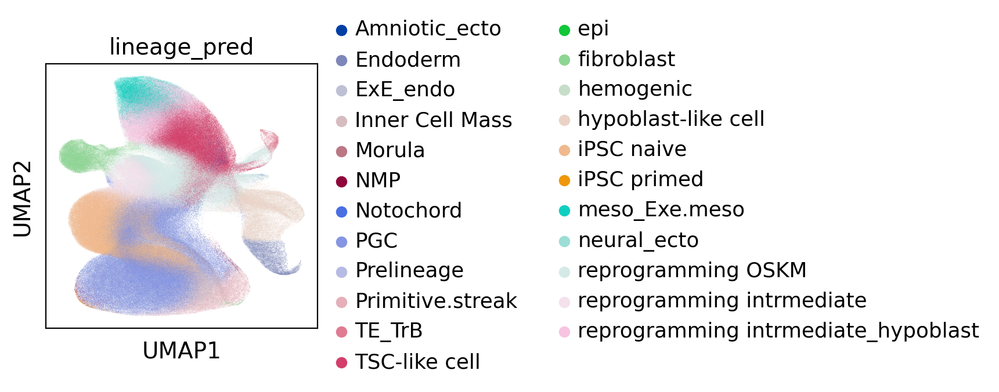

In [4]:
adata.obsm['X_umap'] = adata.obsm['X_umap_scpoli_lineage']
sc.pl.umap(
    adata,
    color="lineage_pred")

In [6]:
adata_full=sc.read('/storage2/liuxiaodongLab/jiangjing/Projects/XueyingFan/PD_XueyingFan/20260209_hypoblast_99sample_anno/output/adata_qc_with_groups_scpoli.h5ad')
adata_full

AnnData object with n_obs × n_vars = 1170931 × 37165
    obs: 'condition', 'cell_name_in_hg38_mm10', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'n_genes', 'leiden', 'group', 'day', 'group_day', 'orig.ident', 'is_original_query', 'original_query_id', 'lineage_pred', 'lineage_uncert'
    var: 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: 'hvg', 'leiden', 'log1p', 'neighbors', 'pca', 'umap'
    obsm: 'X_pca', 'X_umap', 'X_umap_scpoli_lineage', 'scpoli'
    varm: 'PCs'
    layers: 'counts', 'logcounts'
    obsp: 'connectivities', 'distances'

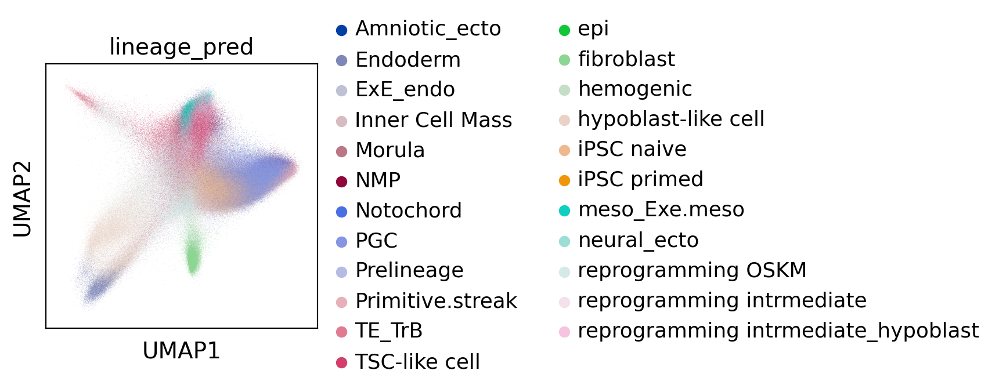

In [7]:
adata_full.obsm['X_umap'] = adata_full.obsm['scpoli']
sc.pl.umap(
    adata_full,
    color="lineage_pred")

In [8]:
del adata

In [9]:
use_rep = "scpoli"
seed=42
sc.pp.neighbors(adata_full, use_rep=use_rep, random_state=seed)

In [10]:
# UMAP降维
print("计算UMAP...")
sc.tl.umap(adata_full, random_state=seed)

计算UMAP...


In [11]:
cluster_key = f'leiden_res_0.4'
sc.tl.leiden(adata_full, resolution=0.4, key_added=cluster_key, random_state=seed)

In [12]:
adata_full

AnnData object with n_obs × n_vars = 1170931 × 37165
    obs: 'condition', 'cell_name_in_hg38_mm10', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'n_genes', 'leiden', 'group', 'day', 'group_day', 'orig.ident', 'is_original_query', 'original_query_id', 'lineage_pred', 'lineage_uncert', 'leiden_res_0.4'
    var: 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: 'hvg', 'leiden', 'log1p', 'neighbors', 'pca', 'umap', 'lineage_pred_colors'
    obsm: 'X_pca', 'X_umap', 'X_umap_scpoli_lineage', 'scpoli'
    varm: 'PCs'
    layers: 'counts', 'logcounts'
    obsp: 'connectivities', 'distances'

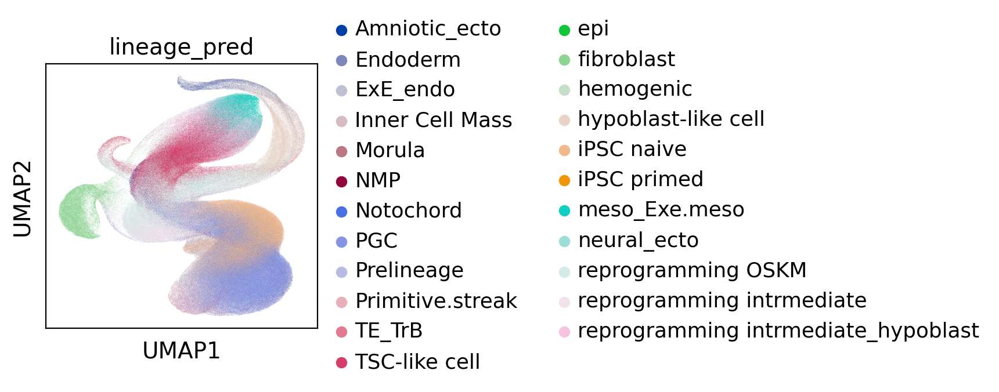

In [14]:
sc.pl.umap(
    adata_full,
    color="lineage_pred")

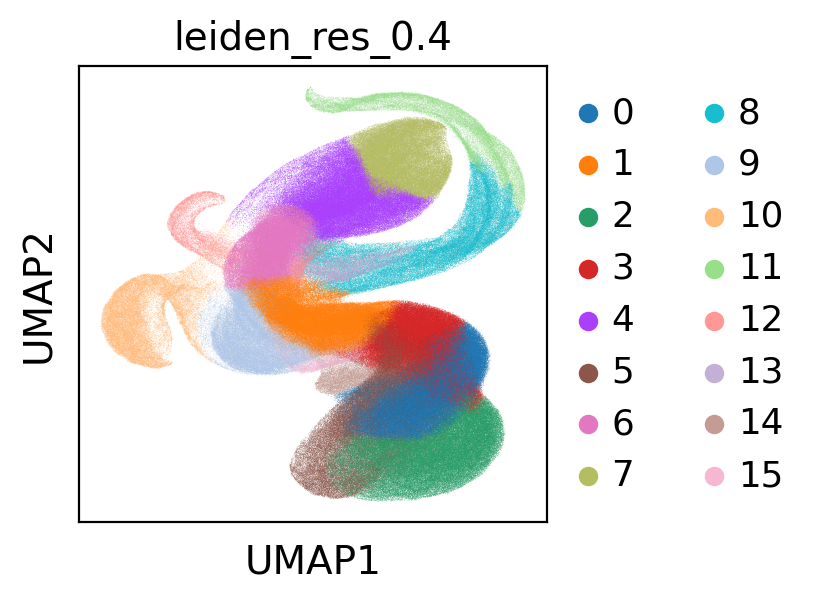

In [15]:
sc.pl.umap(
    adata_full,
    color="leiden_res_0.4")

In [16]:
adata_full.write_h5ad('hypo_batch1_99_final.h5ad')

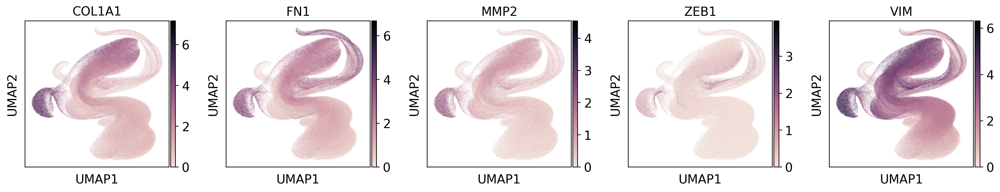

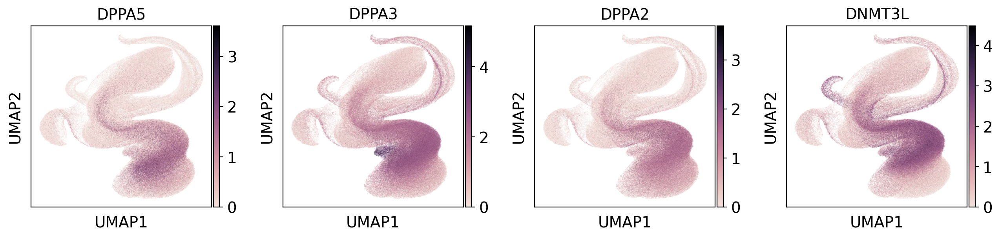

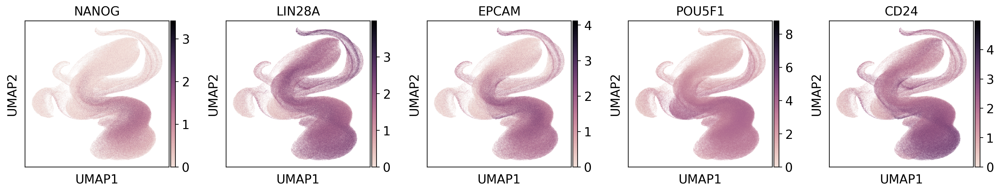

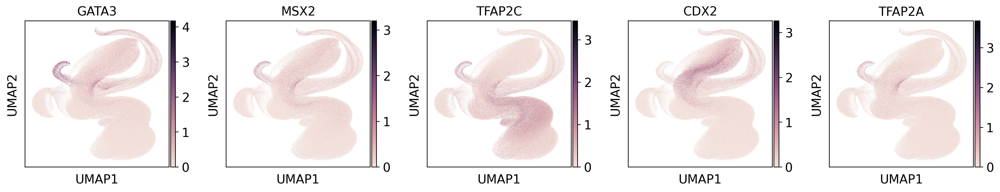

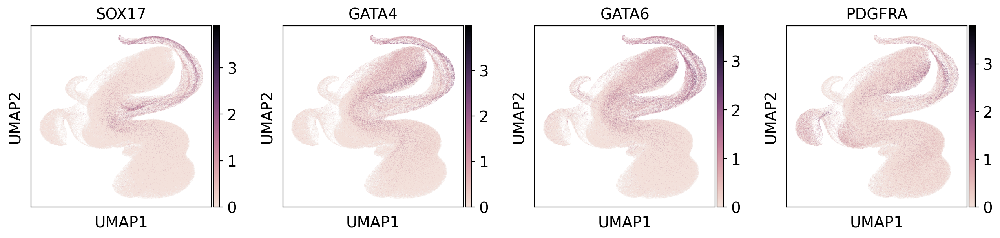

In [17]:
# Define the list of genes you want to plot
marker_dict = {
    'Fibroblast': ['COL1A1', 'FN1', 'MMP2', 'ZEB1', 'VIM'],
    'iPSC naive': ['DPPA5', 'DPPA3', 'DPPA2', 'DNMT3L'],
    'iPSC primed': ['NANOG', 'LIN28A', 'EPCAM', 'POU5F1', 'CD24'],
    'TSC': ['GATA3', 'MSX2', 'TFAP2C', 'CDX2', 'TFAP2A'],
    'Hypoblast': ['SOX17', 'GATA4', 'GATA6', 'PDGFRA']
}
# 为每个组创建单独的图形
for cell_type, genes in marker_dict.items():
    existing_genes = [gene for gene in genes if gene in adata_full.var_names]
    if existing_genes:  # 只绘制存在的基因
        sc.pl.umap(adata_full, color=existing_genes, ncols=len(existing_genes),
                  cmap=sns.cubehelix_palette(dark=0, light=.9, as_cmap=True))

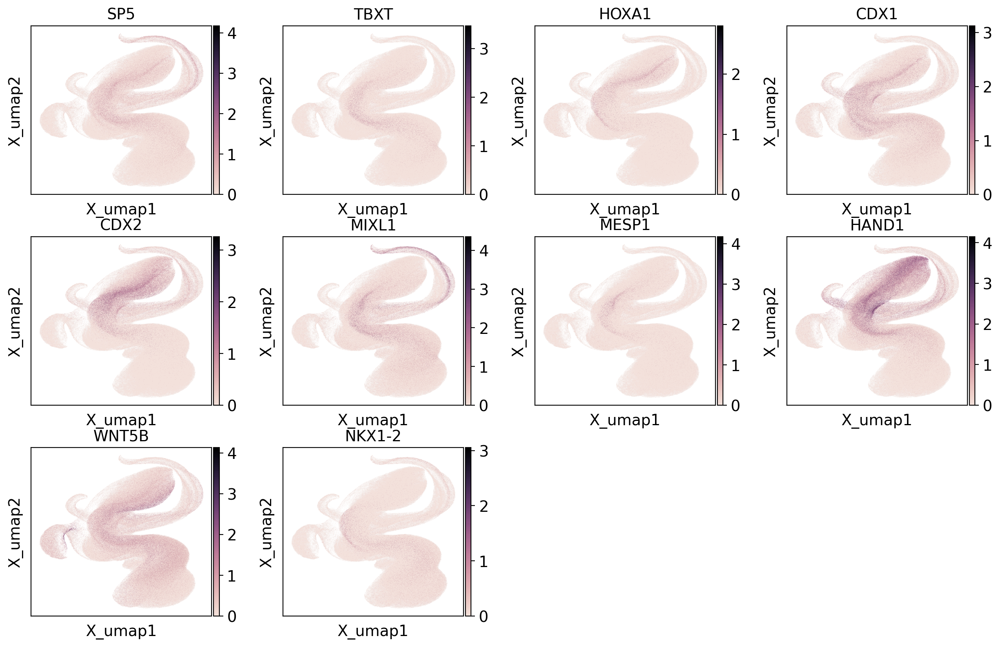

In [18]:
# Define the list of genes you want to plot
genes_to_plot = ['SP5', 'TBXT', 'HOXA1', 'CDX1', 'CDX2', 'MIXL1', 'MESP1', 'HAND1', 'WNT5B', 'NKX1-2']  

# Plot the UMAP embedding for the specified genes
sc.pl.embedding(
    adata_full,
    basis='X_umap',
    color=genes_to_plot,
    use_raw=False,
    cmap=sns.cubehelix_palette(dark=0, light=.9, as_cmap=True)
)

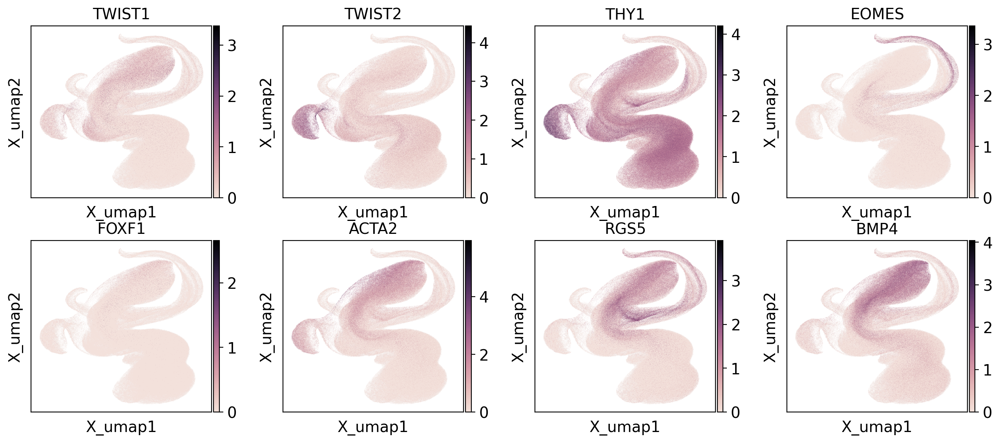

In [19]:
# Define the list of genes you want to plot'
genes_to_plot = ['TWIST1', 'TWIST2', 'THY1','EOMES', 'FOXF1','ACTA2', 'RGS5', 'BMP4']  

# Plot the UMAP embedding for the specified genes
sc.pl.embedding(
    adata_full,
    basis='X_umap',
    color=genes_to_plot,
    use_raw=False,
    cmap=sns.cubehelix_palette(dark=0, light=.9, as_cmap=True)
)

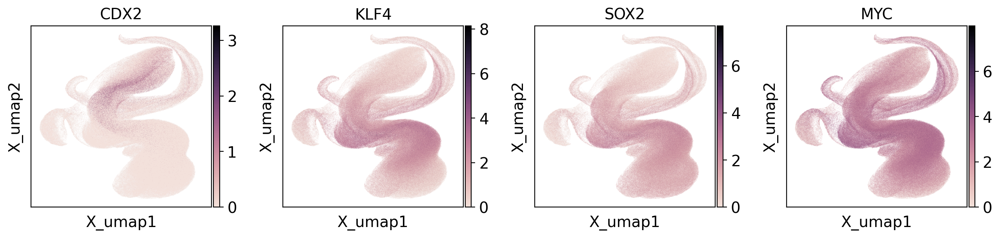

In [20]:
# Define the list of genes you want to plot
genes_to_plot = ['CDX2', 'KLF4', 'SOX2', 'MYC']  

# Plot the UMAP embedding for the specified genes
sc.pl.embedding(
    adata_full,
    basis='X_umap',
    color=genes_to_plot,
    use_raw=False,
    cmap=sns.cubehelix_palette(dark=0, light=.9, as_cmap=True)
)

In [24]:
leiden_to_celltype = {
    '0': 'iPSC naive',
    '1': 'Reprogramming intermediate', 
    '2': 'iPSC primed',
    '3': 'iPSC naive',
    '4': 'Mesoderm-like cell',
    '5': 'iPSC primed',
    '6': 'Reprogramming intermediate',
    '7': 'Mesoderm-like cell', 
    '8': 'Reprogramming intermediate',
    '9': 'Reprogramming intermediate',
    '10': 'Fibroblast',
    '11': 'Hypoblast-like cell',
    '12': 'TSC-like cell',
    '13': 'Reprogramming intermediate', 
    '14': 'iPSC naive',
    '15': 'Reprogramming intermediate',
}

# 应用映射
adata_full.obs['celltype'] = adata_full.obs['leiden_res_0.4'].map(leiden_to_celltype)

print("\n使用映射字典后的聚类分布：")
print(adata_full.obs['celltype'].value_counts())


使用映射字典后的聚类分布：
Reprogramming intermediate    365519
iPSC naive                    289504
iPSC primed                   216748
Mesoderm-like cell            196267
Fibroblast                     46989
Hypoblast-like cell            33250
TSC-like cell                  22654
Name: celltype, dtype: int64


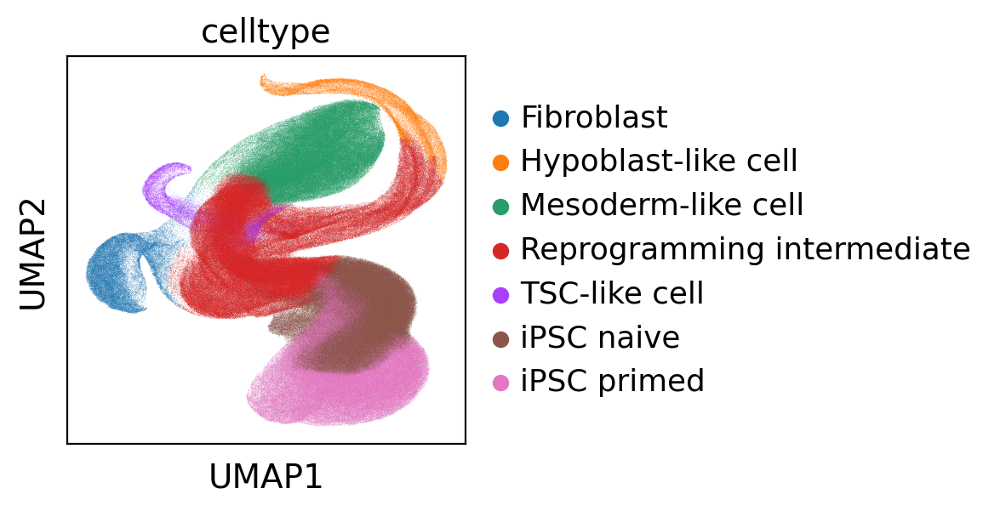

In [25]:
sc.pl.umap(
    adata_full,
    color="celltype")